##### Copyright 2024 Google LLC.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Object detection with Gemini 1.5 Flash

<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/examples/Object_detection.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
</table>

This notebook introduces object detection with the Gemini API. It's based on a really great example shared by [Aishwarya Kamath](https://twitter.com/ashkamath20/status/1793667029104574647), with just minor changes. For even more cool examples of what you can do with object detection, check out this neat thread by [Alexander Chen](
https://x.com/alexanderchen/status/1796225933235417447), and this [interactive demo](https://gemini-spatial-example.grantcuster.com/).

You'll learn to perform object detection like this:

<img src="https://storage.googleapis.com/generativeai-downloads/images/object_detection.png" />


There are many examples, including object detection with

* Single and multiple classes (with and without attributes)
* Detection and counting
* Multiple classes with negatives
* Object detection with world knowledge
* Object detection with text on images
* Visual question answering
* And even an interactive example

**Note**

This notebook is too large to display on GitHub (open it in Colab and scroll through to see the full output). The notebook has been saved with output as the parsing code is a bit brittle (nothing to do with Gemini, that's just how it was written). If you get errors when running, check out how the response is parsed, and edit from there. One could even write another prompt with Gemini, to perfectly parse the output ;)

----

In [ ]:
!pip install -U -q google-generativeai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 1.4 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
import google.generativeai as genai
from PIL import Image

import io
import os
import requests

### Setup your API key

To run the following cell, your API key must be stored it in a Colab Secret named `GOOGLE_API_KEY`. If you don't already have an API key, or you're not sure how to create a Colab Secret, see [Authentication](https://github.com/google-gemini/cookbook/blob/main/quickstarts/Authentication.ipynb) for an example.

In [ ]:
from google.colab import userdata
GOOGLE_API_KEY=userdata.get('GOOGLE_API_KEY')
genai.configure(api_key=GOOGLE_API_KEY)

## Create a model

You should lower the safety features to prevent the outputs to be blocked. This is safe since the prompts are not meant to be seen by end-users but to be used by other functions.

In [ ]:
safety_settings = [
  {
    "category": "HARM_CATEGORY_HARASSMENT",
    "threshold": "BLOCK_ONLY_HIGH",
  },
  {
    "category": "HARM_CATEGORY_HATE_SPEECH",
    "threshold": "BLOCK_ONLY_HIGH",
  },
  {
    "category": "HARM_CATEGORY_SEXUALLY_EXPLICIT",
    "threshold": "BLOCK_ONLY_HIGH",
  },
  {
    "category": "HARM_CATEGORY_DANGEROUS_CONTENT",
    "threshold": "BLOCK_ONLY_HIGH",
  },
]

model = genai.GenerativeModel(
  model_name='gemini-1.5-flash-latest',
  safety_settings=safety_settings,
)

## Utils

Some plotting and parsing utilities.

In [ ]:
# @title Plotting Utils
import json
import random
import io
from PIL import Image, ImageDraw
from PIL import ImageColor

additional_colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]

def plot_bounding_boxes(im, noun_phrases_and_positions):
    """
    Plots bounding boxes on an image with markers for each noun phrase, using PIL, normalized coordinates, and different colors.

    Args:
        img_path: The path to the image file.
        noun_phrases_and_positions: A list of tuples containing the noun phrases
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = im
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'orange',
    'pink',
    'purple',
    'brown',
    'gray',
    'beige',
    'turquoise',
    'cyan',
    'magenta',
    'lime',
    'navy',
    'maroon',
    'teal',
    'olive',
    'coral',
    'lavender',
    'violet',
    'gold',
    'silver',
    ] + additional_colors

    # Iterate over the noun phrases and their positions
    for i, (noun_phrase, (y1, x1, y2, x2)) in enumerate(
        noun_phrases_and_positions):
        # Select a color from the list
        color = colors[i % len(colors)]

        # Convert normalized coordinates to absolute coordinates
        abs_x1 = int(x1/1000 * width)
        abs_y1 = int(y1/1000 * height)
        abs_x2 = int(x2/1000 * width)
        abs_y2 = int(y2/1000 * height)

        # Draw the bounding box
        draw.rectangle(
            ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4
        )

        # Draw the text
        draw.text((abs_x1 + 8, abs_y1 + 6), noun_phrase, fill=color)

    # Display the image
    img.show()

In [ ]:
# @title RegionSelector utils
# Adapted from https://colab.research.google.com/drive/1bjGbrtjE_Ugc3YpIvQMtkqsiMPqIp89W#scrollTo=02GJS3Zv4JAu  written by Andreas Steiner and Gabriel Antoine le Roux
import base64
import io

import google.colab.output as output
import IPython
import numpy as np
import PIL

bbox_str = None
bbox_hist = ''

def set_bbox_str(x):
  global bbox_str
  global bbox_hist
  bbox_str = x
  bbox_hist += x + '\n'


output.register_callback('set_bbox_str', set_bbox_str)


class RegionSelector:

  def __init__(self, img):
    src = self._img2src(img)
    IPython.display.display(IPython.display.HTML(r"""
    <pre id="stuff">
      <img id="img" src="__SRC__">
    </pre>
    <pre id="pre"></pre>
    <script>
    const img = document.getElementById('img')
    const pre = document.getElementById('pre')
    const stuff = document.getElementById('stuff')
    const boxes = []
    let x0=null, y0=null
    function update(x, y) {
      const x1 = Math.min(x, x0)
      const y1 = Math.min(y, y0)
      const x2 = Math.max(x, x0)
      const y2 = Math.max(y, y0)
      const el = boxes[boxes.length - 1]
      el.style.left = x1 + 'px'
      el.style.top = y1 + 'px'
      el.style.width = (x2 - x1) + 'px'
      el.style.height = (y2 - y1) + 'px'
      const ret = [x1, y1, x2, y2]
      return ret
    }
    img.addEventListener('mousedown', e => {
      const el = document.createElement('div')
      el.style.border = '2px solid red'
      el.style.position = 'absolute'
      stuff.append(el)
      boxes.push(el)
      x0 = e.clientX
      y0 = e.clientY
      update(x0, y0)
      e.stopPropagation()
    })
    window.addEventListener('mousemove', e => {
      if (x0 === null) return
      update(e.clientX, e.clientY)
      e.stopPropagation()
    })
    window.addEventListener('mouseup', e => {
      if (x0 === null) return
      const coords = update(e.clientX, e.clientY)
      const rect = img.getBoundingClientRect();
      let absoluteCoords = [
        coords[0] - rect.left,
        coords[1] - rect.top,
        coords[2] - rect.left,
        coords[3] - rect.top,
        ];
      const bbox_str = JSON.stringify(absoluteCoords)
      pre.textContent += bbox_str + '\n'
      google.colab.kernel.invokeFunction(
        'set_bbox_str', [bbox_str], {})
      x0 = y0 = null
      e.stopPropagation()
    })
    """.replace('__SRC__', src)))

  def _img2src(self, img):
    if isinstance(img, np.ndarray):
      if img.dtype != 'uint8':
        img = (255 * img).astype('uint8')
      img = PIL.Image.fromarray(img)
    f = io.BytesIO()
    img.save(f, format='JPEG')
    s = base64.b64encode(f.getvalue()).decode('ascii')
    return 'data:image/jpg;base64,%s' % s

  def set_image(self, img):
    """Updates image content."""
    google.colab.output.eval_js(
        f'TextImage_set_img({self._img2src(img)})',
        ignore_result=self.ignore_result,
    )

In [ ]:
# @title Parsing utils
def parse_list_boxes(text):
  result = []
  for line in text.strip().splitlines():
    # Extract the numbers from the line, remove brackets and split by comma
    try:
      numbers = line.split('[')[1].split(']')[0].split(',')
    except:
      numbers =  line.split('- ')[1].split(',')

    # Convert the numbers to integers and append to the result
    result.append([int(num.strip()) for num in numbers])

  return result

def parse_list_boxes_with_label(text):
  text = text.split("```\n")[0]
  return json.loads(text.strip("```").strip("python").strip("json").replace("'", '"').replace('\n', '').replace(',}', '}'))

def postproc_bbox_str(height, width):
 x0, y0, x1, y1 = [float(x) for x in bbox_str.removeprefix('[').removesuffix(']').split(',')]
 x0 = int(np.round(x0 / width * 1000))
 y0 = int(np.round(y0 / height * 1000))
 x1 = int(np.round(x1 / width * 1000))
 y1 = int(np.round(y1 / height * 1000))
 return f'{y0} {x0} {y1} {x1}'

def postproc_bbox_hist(height, width):
  bbox_strs = bbox_hist.rstrip().split("\n")
  results = []
  for bbox_str in bbox_strs:
    x0, y0, x1, y1 = [float(x) for x in bbox_str.removeprefix('[').removesuffix(']').split(',')]
    x0 = int(np.round(x0 / width * 1000))
    y0 = int(np.round(y0 / height * 1000))
    x1 = int(np.round(x1 / width * 1000))
    y1 = int(np.round(y1 / height * 1000))
    results.append(f" (x = {(x0 + x1) // 2}, y = {(y0 + y1)//2}); ")
  return results

## Open vocabulary object detection

### Basic Example - Single class

In this example you probe the model for "umbrella".

Image [source](https://en.wikipedia.org/wiki/Three_Women_with_Parasols#/media/File:Marie_Bracquemond_Trois_femmes.jpg).

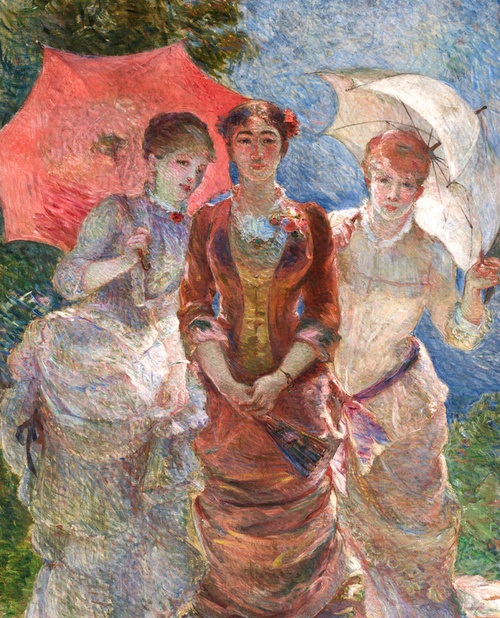

In [ ]:
url = "https://storage.googleapis.com/generativeai-downloads/images/Marie_Bracquemond.jpeg"
im = Image.open(io.BytesIO(requests.get(url).content))
im

In [ ]:
response = model.generate_content([
    im,
    (
        "Return bounding boxes for all the umbrellas in the following format as"
        " a list. \n [ymin, xmin, ymax, xmax]"
    ),
])
print(response.text)

- [61, 0, 412, 501]
- [108, 604, 514, 998]



(500, 618)


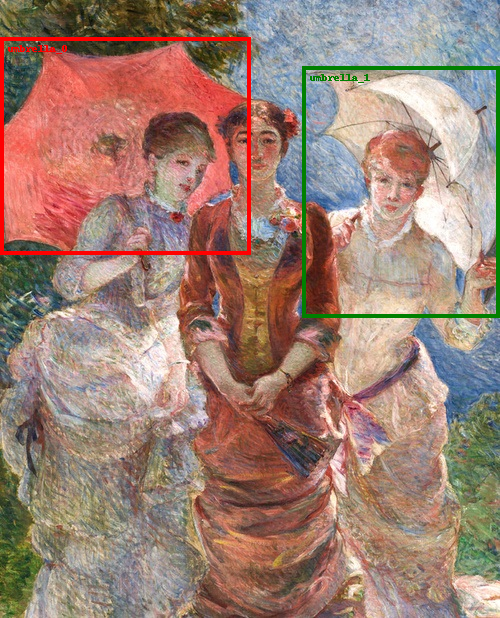

In [ ]:
boxes = parse_list_boxes(response.text)
im = Image.open(io.BytesIO(requests.get(url).content))
boxes = {f'umbrella_{i}': x for i, x in enumerate(boxes)}
plot_bounding_boxes(im, noun_phrases_and_positions=list(boxes.items()))
im

### Advanced Example - Multiple classes, with and without attributes, and negatives

Let's now ask the model to find multiple classes of objects but also limiting the umbrellas to the red ones and the dresses to the white ones. Let's also ask for dogs which are not present in the image to make sure that the model can refrain from predicting in case of negatives.

In [ ]:
im = Image.open(io.BytesIO(requests.get(url).content))
response = model.generate_content([
    im,
    (
        "Return bounding boxes for red umbrellas, persons with white dresses and dogs in the"
        " following format as a list. \n {'umbrella_0' : [ymin, xmin, ymax,"
        " xmax], ...} \n If there are more than one instance of an object, add"
        " them to the dictionary as 'object_0', 'object_1', etc."
    ),
])
print(response.text)

{  'umbrella_0': [60, 0, 426, 489],
  'umbrella_1': [95, 591, 477, 998],
  'person_0': [170, 0, 998, 437],
  'person_1': [157, 355, 998, 688],
  'person_2': [208, 650, 998, 998]
}


(500, 618)


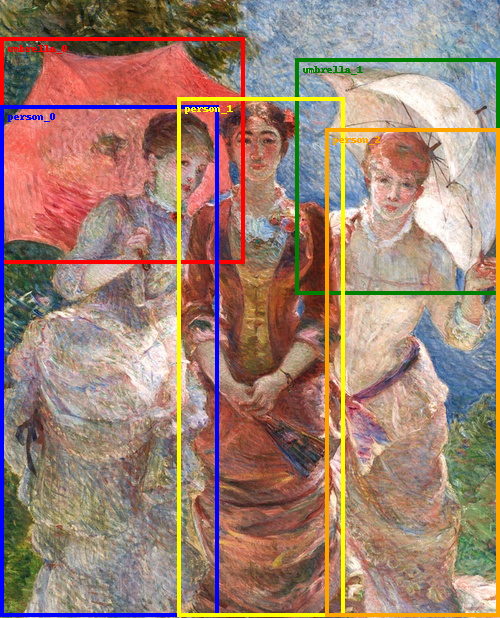

In [ ]:
im = Image.open(io.BytesIO(requests.get(url).content))
boxes = parse_list_boxes_with_label(response.text)
plot_bounding_boxes(im, noun_phrases_and_positions=list(boxes.items()))
im

## World knowledge 🤝 Object detection

Using LLMs for detection means that you can query for world knowledge at the same time!

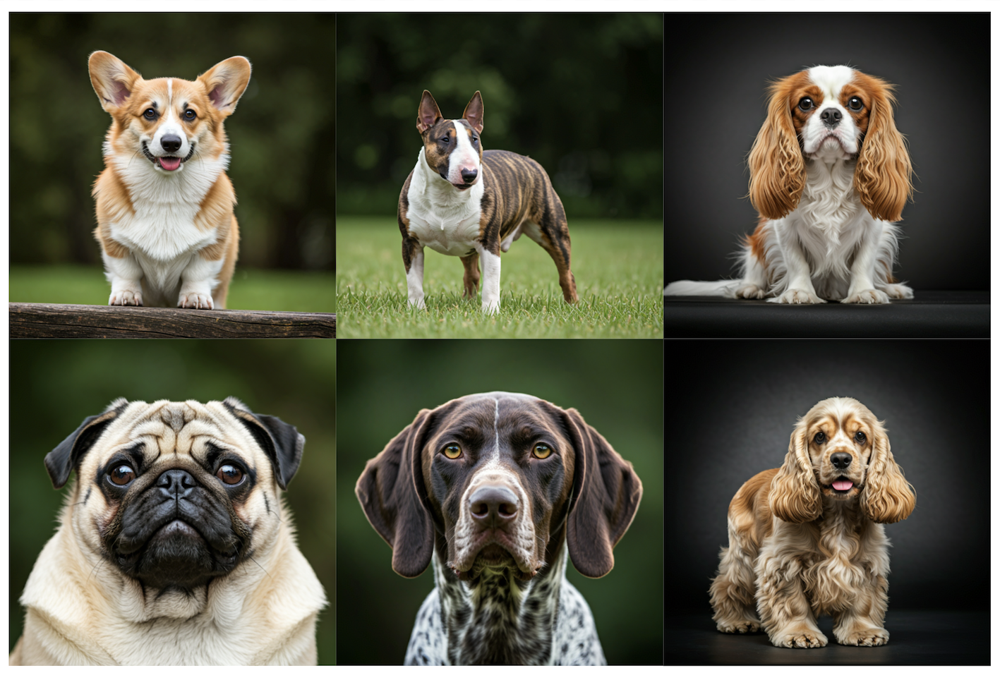

In [ ]:
url = "https://github.com/geminidemospatial/SpatialDemo/blob/main/gem_dogs.png?raw=true"
im = Image.open(io.BytesIO(requests.get(url).content))
im

In [ ]:
response = model.generate_content([
    im,
    (
        "Return bounding boxes for for all the dogs while mentioning their"
        " breed in the following format as a dictionary.\n [ymin, xmin, ymax,"
        " xmax] "
    ),
])
print(response.text)

{
  "Corgi": [71,84,458,248],
  "Bull Terrier": [136,395,471,583],
  "Cavalier King Charles Spaniel": [94,715,468,913],
  "Pug": [586,17,986,326],
  "German Shorthaired Pointer": [578,366,982,632],
  "Cocker Spaniel": [598,703,968,906]
}


(1417, 954)


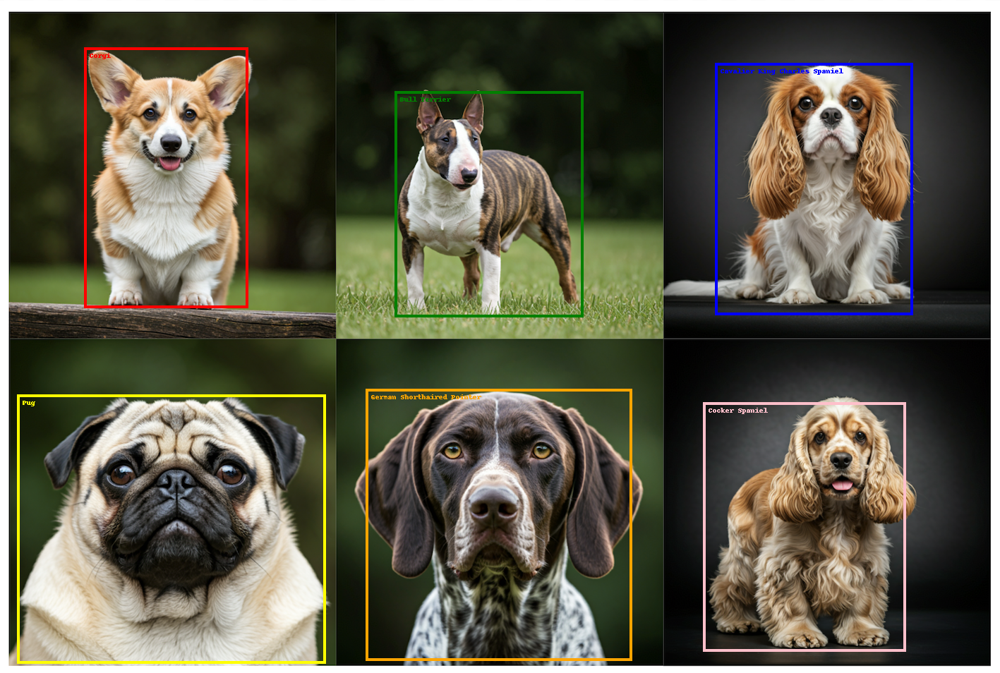

In [ ]:
im = Image.open(io.BytesIO(requests.get(url).content))
boxes = parse_list_boxes_with_label(response.text)
plot_bounding_boxes(im, noun_phrases_and_positions=list(boxes.items()))
im

## Detection based on Handwritten Prompts

Our newest Gemini models are able to read handwritten text and find objects in the image that they refer to. Here is an illustration of the front door of a castle, with some handwritten prompts that I added manually at the bottom!

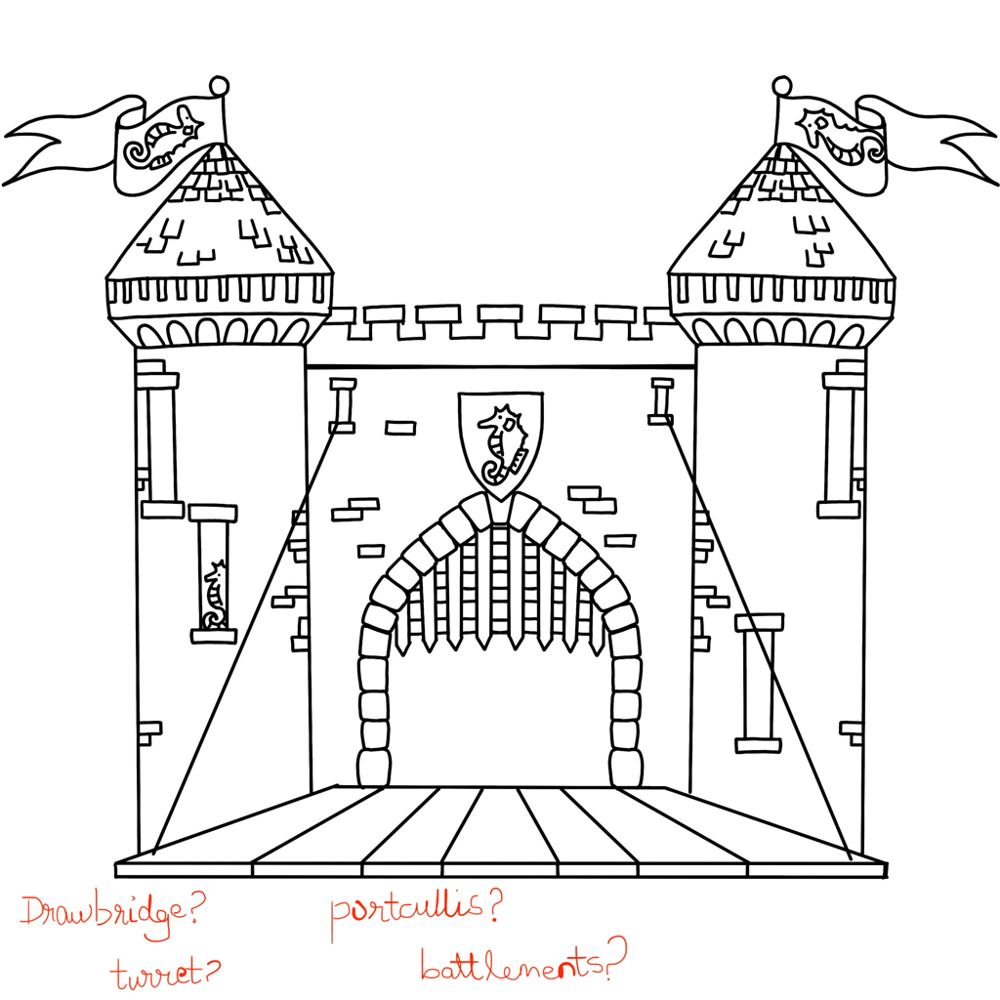

In [ ]:
url = "https://github.com/geminidemospatial/SpatialDemo/blob/main/castle3.jpeg?raw=true"
im = Image.open(io.BytesIO(requests.get(url).content)).resize((1024, 1024))
im.save("demo_image.jpg")
im

In [ ]:
question = (
    "Return bounding boxes for the objects referred to in the following format"
    " as a list.\n If there are more than one instance of an object, add them"
    " to the dictionary as 'object_0', 'object_1', etc.  \n{'piano_0' : [ymin,"
    " xmin, ymax, xmax], 'apple_0': [ymin, xmin, ymax, xmax] ...}"
)
response = model.generate_content([im, question])
print(response.text)

{
  'turret_0': [64,654,355,946],
  'turret_1': [66,70,357,335],
  'portcullis_0': [503,359,674,636],
  'battlements_0': [307,324,350,666],
  'drawbridge_0': [414,145,870,869]
}


(1024, 1024)


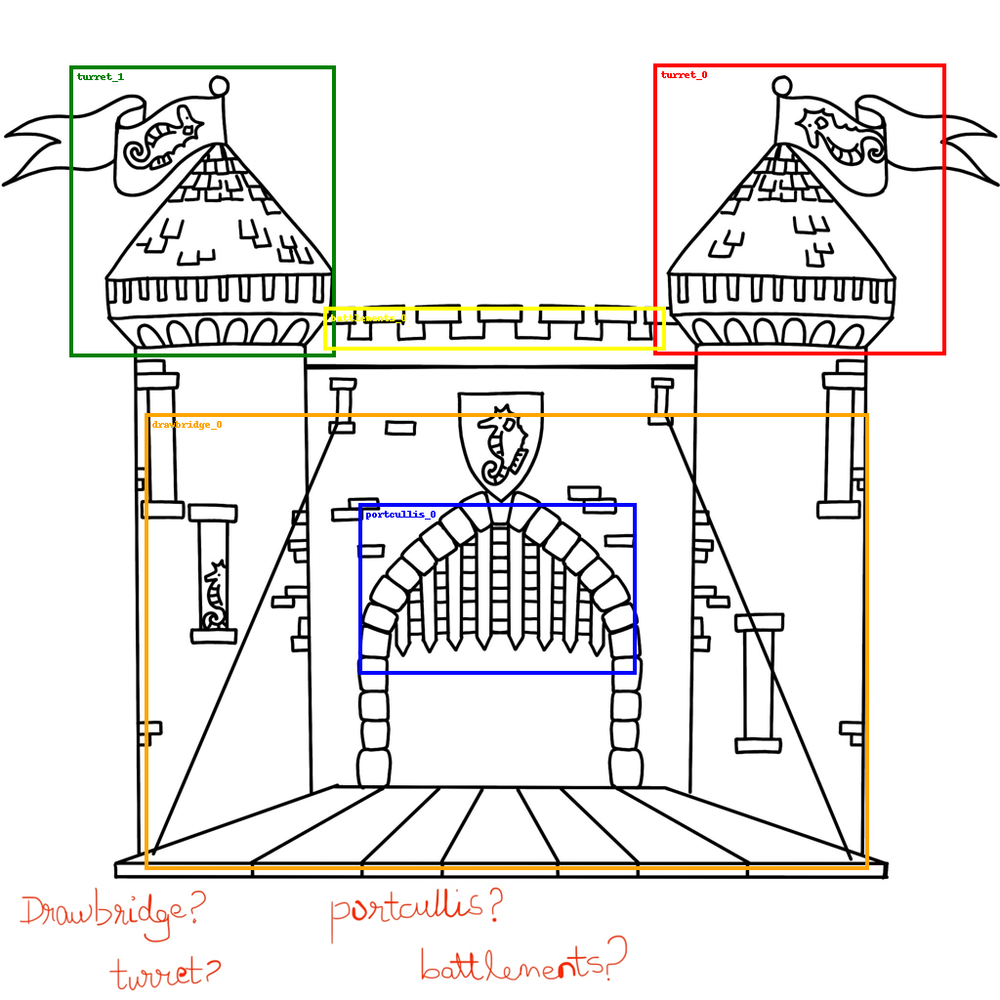

In [ ]:
boxes = parse_list_boxes_with_label(response.text)
plot_bounding_boxes(im, noun_phrases_and_positions=list(boxes.items()))
im

In [ ]:
def upload_to_gemini(path, mime_type=None):
  """Uploads the given file to Gemini.

  See https://ai.google.dev/gemini-api/docs/prompting_with_media
  """
  file = genai.upload_file(path, mime_type=mime_type)
  print(f"Uploaded file '{file.display_name}' as: {file.uri}")
  return file

image = upload_to_gemini("demo_image.jpg", mime_type="image/jpeg")

chat_session = model.start_chat(
    history=[
        {
            "role": "user",
            "parts": [image, question],
        },
        {
            "role": "model",
            "parts": [
                response.text,
            ],
        },
    ]
)

response = chat_session.send_message("Give me their definitions in markdown.")
print(response.text)

Uploaded file 'demo_image.jpg' as: https://generativelanguage.googleapis.com/v1beta/files/z71ky8uhbxzf
- **turret_0**: A small tower projecting from a wall, especially one forming part of a larger building.

- **turret_1**: A small tower projecting from a wall, especially one forming part of a larger building.

- **portcullis_0**:  A strong, heavy grating or gate made of timber or iron, lowered vertically by chains and used to close the entrance to a castle or fortified place.

- **battlements_0**:  A series of indentations along the top of a wall or rampart, providing cover for defenders.

- **drawbridge_0**:  A bridge that can be raised or lowered, typically used to provide access to a castle or fortified place. 



## Pointing by drawing a bounding box interactively 📝

The model can also answer questions about parts of the image, by providing box
co-ordinates of areas of interest, as shown below.

Here you can interactively draw a bounding box on the image and then ask
questions about it.

In this example, you query the region showing a laptop. Try out other parts of
the image yourself! :D

For drawing the box, **click and then drag**.

In [ ]:
url = "https://storage.googleapis.com/generativeai-downloads/images/Marie_Bracquemond.jpeg"
im = Image.open(io.BytesIO(requests.get(url).content))
np_img = np.array(im)

Draw a bounding box here



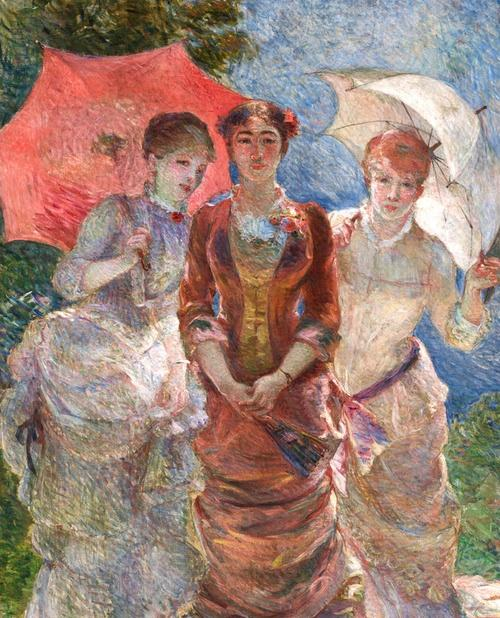

In [ ]:
# Before drawing a box, please re-run this cell.
print('Draw a bounding box here')
RegionSelector(np_img)

In [ ]:
width, height = im.size
postprocessed_bbox_str = postproc_bbox_str(height, width)
print("Post processed box string:", postprocessed_bbox_str)

Post processed box string: 80 635 425 965


In [ ]:
im = Image.open(io.BytesIO(requests.get(url).content))
question = (
    "What is present in the image at the following positions:"
    f" [{postprocessed_bbox_str}]?"
)
response = model.generate_content([im, question])
print(response.text)

The image contains a white parasol.


In [ ]:
im = Image.open(io.BytesIO(requests.get(url).content))
im.save("demo_img.jpg")
image = upload_to_gemini("demo_img.jpg", mime_type="image/jpeg")

chat_session = model.start_chat(
    history=[
        {
            "role": "user",
            "parts": [image, question],
        },
        {"role": "model", "parts": [response.text]},
    ]
)

response = chat_session.send_message(
    f"What is the object at {postprocessed_bbox_str} ?"
)

print(response.text)

Uploaded file 'demo_img.jpg' as: https://generativelanguage.googleapis.com/v1beta/files/45441w1l5kg2
The object at position 80 635 425 965 is a white parasol.


## Spatial reasoning

Some examples of spatial understanding.

Images from [What's up with VLMs](https://github.com/amitakamath/whatsup_vlms)

### Example 1

In [ ]:
img1 = Image.open(
    requests.get(
        "https://github.com/geminidemospatial/SpatialDemo/blob/main/dog_on_table.jpeg?raw=true",
        stream=True,
    ).raw
)
img2 = Image.open(
    requests.get(
        "https://github.com/geminidemospatial/SpatialDemo/blob/main/dog_under_table.jpeg?raw=true",
        stream=True,
    ).raw
)
img3 = Image.open(
    requests.get(
        "https://github.com/geminidemospatial/SpatialDemo/blob/main/dog_left_of_table.jpeg?raw=true",
        stream=True,
    ).raw
)
img4 = Image.open(
    requests.get(
        "https://github.com/geminidemospatial/SpatialDemo/blob/main/dog_right_of_table.jpeg?raw=true",
        stream=True,
    ).raw
)

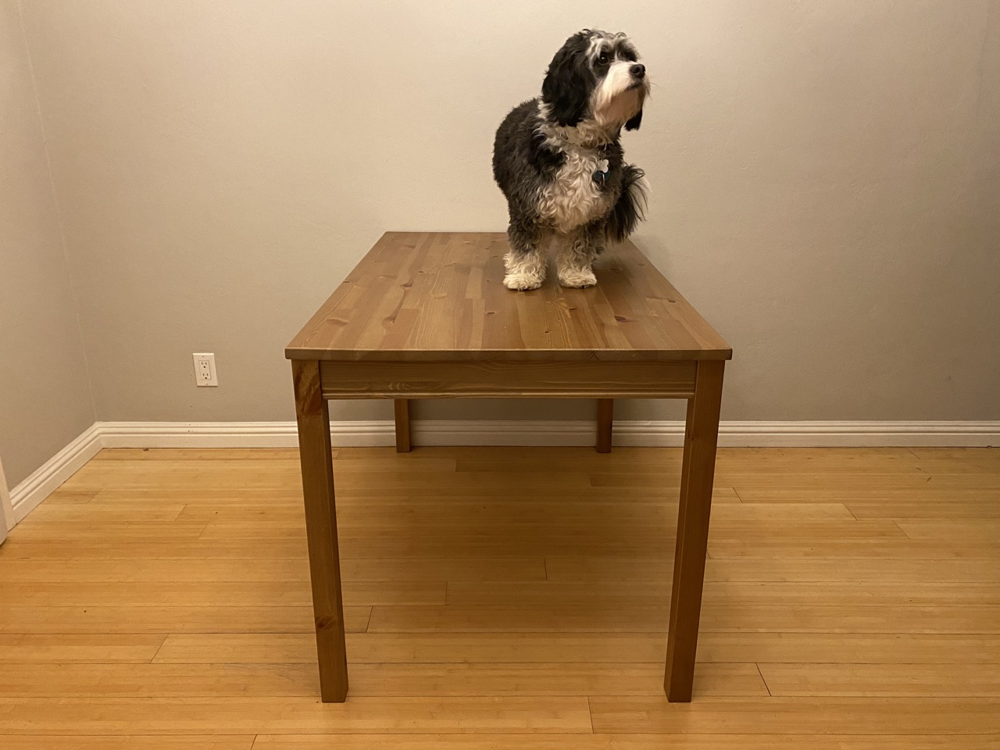

In [ ]:
img1

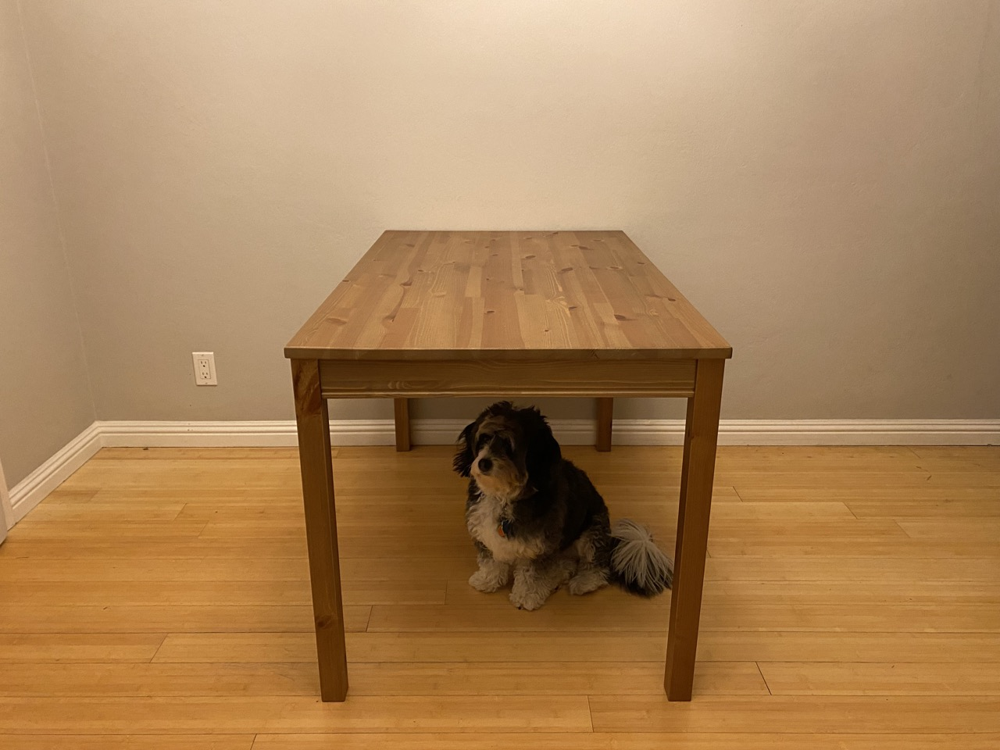

In [ ]:
img2

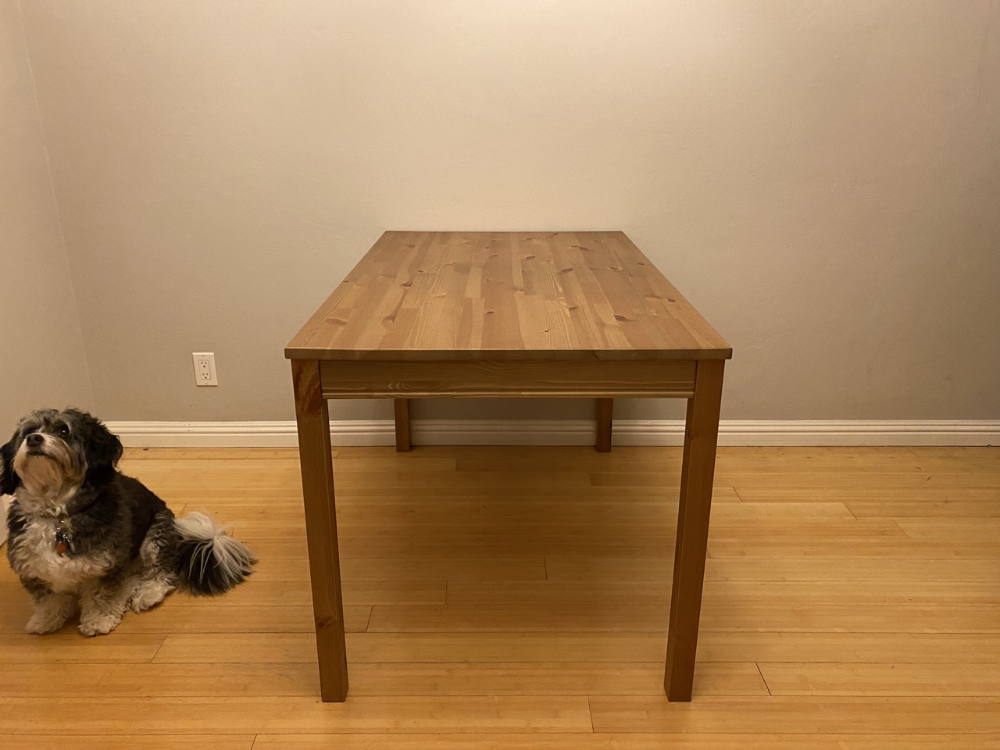

In [ ]:
img3

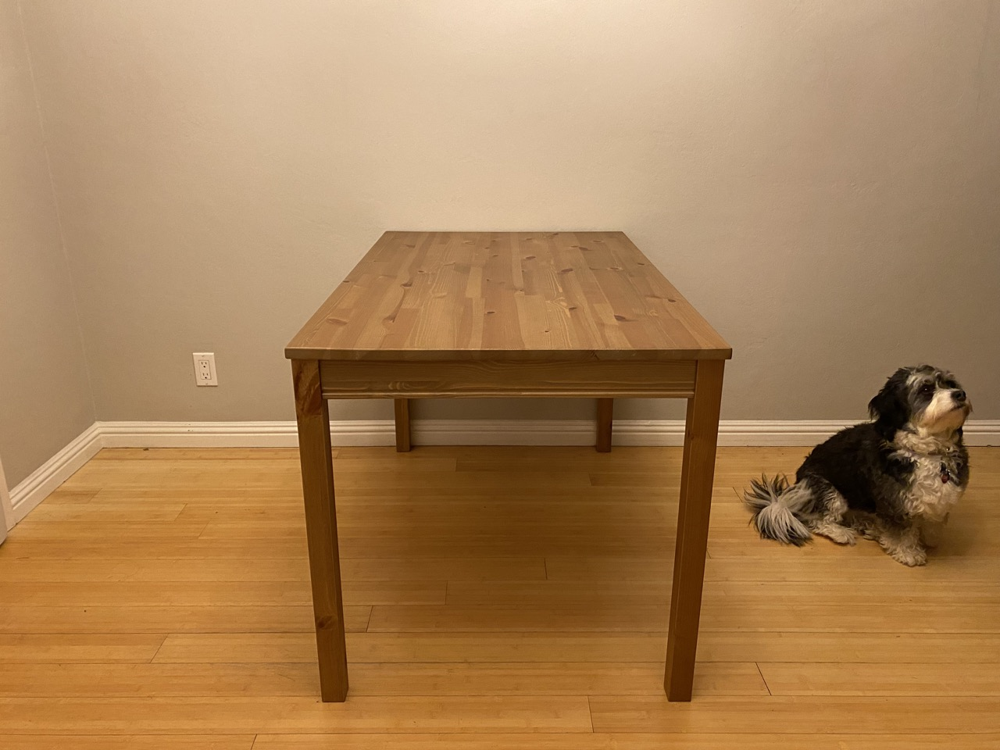

In [ ]:
img4

In [ ]:
response = model.generate_content([
    img1,
    img2,
    img3,
    img4,
    (
        "For each of these images, can you tell me where is the apple with"
        " respect to the armchair?"
    ),
])
print(response.text)

There is no apple in any of these images. The images only contain a dog and a table.


In [ ]:
response = model.generate_content([
    img1,
    img2,
    img3,
    img4,
    (
        "For each of these images, can you tell me where is the dog with"
        " respect to the table?"
    ),
])
print(response.text)

- Image 1: The dog is on top of the table.
- Image 2: The dog is under the table.
- Image 3: The dog is to the left of the table.
- Image 4: The dog is to the right of the table. 



## Visual question answering

Ask questions about details in the image, including text.

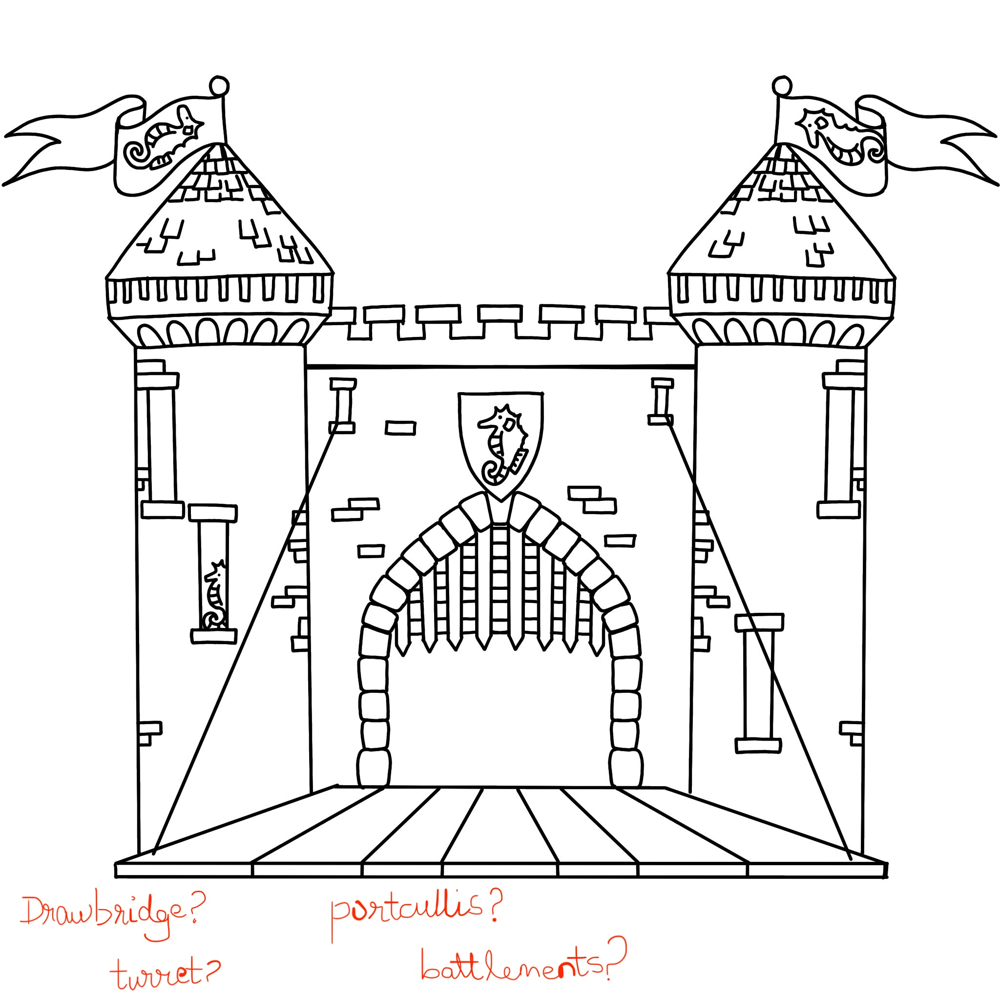

In [ ]:
url = "https://github.com/geminidemospatial/SpatialDemo/blob/main/castle3.jpeg?raw=true"
im = Image.open(io.BytesIO(requests.get(url).content))
im

In [ ]:
response = model.generate_content(
    [im, "What does writing on the image say?"]
)
print(response.text)

The writing on the image says:

- Drawbridge?
- Turret?
- Portcullis?
- Battlements? 



In [ ]:
response = model.generate_content(
    [im, "What animal is on the shield?"]
)
print(response.text)

A seahorse.


In [ ]:
response = model.generate_content(
    [im, "If the drawbridge was raised, how much of the seahorse on the shield would it cover?"]
)
print(response.text)

The drawbridge would cover the whole seahorse on the shield. 



## What's next?

If you want to see more examples of object detection and understanding, you should check [Aishwarya Kamath's colab](https://colab.sandbox.google.com/drive/1eDvf_Ky9jLOZFShgHrm4GI-wkAaQnue6?usp=sharing) that has even more use-cases. You should also check out this neat thread by [Alexander Chen](
https://x.com/alexanderchen/status/1796225933235417447), and this [interactive demo](https://gemini-spatial-example.grantcuster.com/).

Related to image recognition and reasoning, [Market a jet backpack](Market_a_Jet_Backpack.ipynb) and [Guess the shape](Guess_the_shape.ipynb) are worth checking to continue your Gemini discovery.